# Pytorch Model!


Let's learn through doing.

In this notebook we will create an image classifier to detect cat/dog.

We will tackle this problem in 3 parts:
1. Pytorch Dataset
2. Pytorch Model
3. Pytorch Training Loop


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import timm

import matplotlib.pyplot as plt # For data viz
import pandas as pd
import numpy as np
import sys
from tqdm.notebook import tqdm

print('System Version:', sys.version)
print('PyTorch version', torch.__version__)
print('Torchvision version', torchvision.__version__)
print('Numpy version', np.__version__)
print('Pandas version', pd.__version__)

System Version: 3.12.3 (main, Sep 11 2024, 14:17:37) [GCC 13.2.0]
PyTorch version 2.4.1+cu121
Torchvision version 0.19.1+cu121
Numpy version 2.1.1
Pandas version 2.2.2


# Step 1. Pytorch Dataset (and Dataloader)

This is why datasets are important:
- It's an organized way to structure how the data and labels are loaded into the model.
- We can then wrap the dataset in a dataloader and pytorch will handle batching the shuffling the data for us when training the model!

In [2]:
class OurDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data = ImageFolder(data_dir, transform=transform)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        return self.data[idx]
    
    @property
    def classes(self):
        return self.data.classes

## Create Dataset

In [3]:
dataset = OurDataset(
    data_dir='./data/train'
)

In [4]:
len(dataset)

715

0


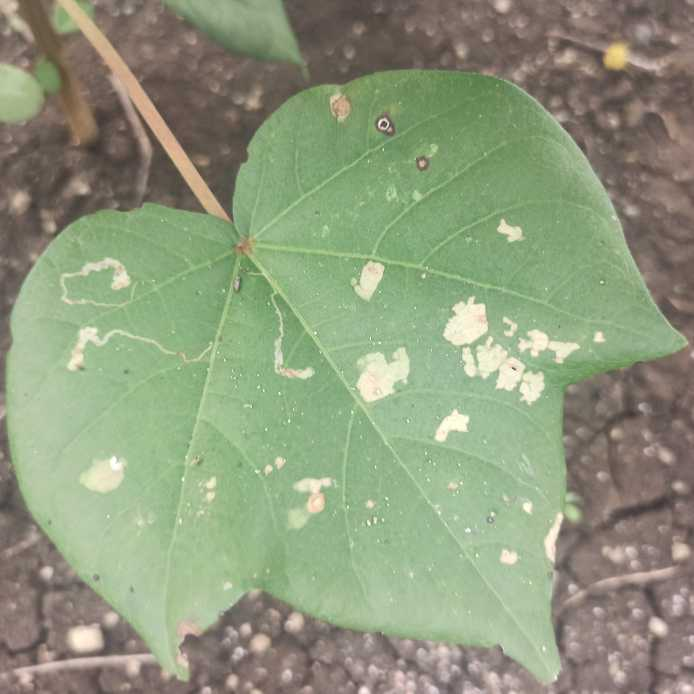

In [5]:
image, label = dataset[4]
print(label)
image

In [6]:
# Get a dictionary associating target values with folder names
data_dir = './data/train'
target_to_class = {v: k for k, v in ImageFolder(data_dir).class_to_idx.items()}
print(target_to_class)

{0: 'diseased leaf', 1: 'fresh leaf'}


In [7]:
transform = transforms.Compose([
    transforms.Resize((227, 227)),
    transforms.ToTensor(),   #Converting to PyTorch Tensor
])

data_dir = './data/train'
dataset = OurDataset(data_dir, transform)

In [8]:
image, label = dataset[10]
image.shape

torch.Size([3, 227, 227])

In [9]:
# iterate over dataset
for image, label in dataset:
    break

## Dataloaders

- Batching our dataset
- It's faster to train the model in batches instead of one at a time.

In [10]:
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

In [11]:
for images, labels in dataloader:
    break

In [12]:
images.shape, labels.shape

(torch.Size([32, 3, 227, 227]), torch.Size([32]))

In [13]:
labels

tensor([0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0,
        0, 0, 1, 1, 1, 1, 0, 1])

**Quick Recap:** We need to first create a PyTorch dataset before we can train our model. We create this by inheriting from the Dataset class. Then created a few methods like length and getitem method. This creates an iterable object which we can loop over.

Then we can create a PyTorch DataLoader which will handle batching the data i.e we wrap our PyTorch dataset with the DataLoader class which will automatically batch this data when feeding into our model.


# Step 2. Pytorch Model

Pytorch datasets have a structured way of organizing your data, pytorch models follow a similar paradigm.
- We could create the model from scratch defining each layer.
- However for tasks like image classification, many of the state of the art architectures are readily available and we can import them from packages like timm.
- Understanding the pytorch model is all about understanding the shape the data is at each layer, and the main one we need to modify for a task is the final layer. Here we have 2 targets, so we will modify the last layer for this.


This below code defines a neural network that uses a pre-trained EfficientNet model as a feature extractor and adds a custom classifier on top to predict the output for a binary or multi-class classification task.

The pretrained=True argument loads weights that were pre-trained on a large dataset (like ImageNet), meaning the model has already learned good general features for image classification. This model is intended to serve as a feature extractor for the task at hand, rather than starting from scratch.

In [14]:
import torchvision.models as models
class SimpleClassifer(nn.Module):
    def __init__(self, num_classes=2):
        super(SimpleClassifer, self).__init__() #Initializes everything from parent class
        # Where we define all the parts of the model
        self.base_model = torch.hub.load('pytorch/vision:v0.10.0', 'alexnet', pretrained=True)
        self.features = nn.Sequential(*list(self.base_model.children())[:-1]) # extract all layers of the EfficientNet-B0 except for the last layer (which is the final classifier specific to the original task it was trained on). The [:-1] slices off the last layer of the EfficientNet, keeping only the feature extraction layers.

        enet_out_size = 9216 # defines the output size of the feature extractor, which for EfficientNet-B0 is 1280. This is the size of the final feature vector that comes out of the EfficientNet's feature layers before classification.
        # Make a classifier
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(enet_out_size, num_classes)
        )
    
    def forward(self, x):
        # Connect these parts and return the output
        x = self.features(x)
        output = self.classifier(x)
        return output


In [15]:
model = SimpleClassifer(num_classes=2)
print(str(model)[:500])

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /home/vyom/.cache/torch/hub/v0.10.0.zip
/media/vyom/DATA/vyom/School/Deploying Artificial Intelligence Systems/pytorch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/media/vyom/DATA/vyom/School/Deploying Artificial Intelligence Systems/pytorch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


SimpleClassifer(
  (base_model): AlexNet(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (4): ReLU(inplace=True)
      (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (6): Conv2d(192, 384, kernel_size=(3


In [16]:
example_out = model(images)
example_out.shape # [batch_size, num_classes]

torch.Size([32, 2])

**Recap:** The model we created, make sure we import from PyTorch's NN module. We create an __init__ and a **forward** method. In __init__ we created the structure of the model. In the **forward** method we define how these parts of the model are connected and will produce our output when called on some input data.

# Step 3. The Training loop

- Now that we understand the general paradigm of pytorch datasets and models, we need to create the process of training this model.
- Some things to consider: We want to validate our model on data it has not been trained on, so usually we split our data into a train and validate datasets. 
    - Terms:
        - Epoch: One run through the entire training dataset.
        - Step: One batch of data as defined in our dataloader
- This loop is one you will become familiar with when training models, you load in data to the model in batches - then calculate the loss and perform backpropagation. There are packages to do this for you, but it's good to have at least written it once to understand how it works.
- Two things to select:
    - optimizer, `adam` is the best place to start for most tasks.
    - loss function: What the model will optimize for.


In [17]:
# Loss function
criterion = nn.CrossEntropyLoss()
# Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [18]:
criterion(example_out, labels)
print(example_out.shape, labels.shape)

torch.Size([32, 2]) torch.Size([32])


## Setup Datasets

In [19]:
transform = transforms.Compose([
    transforms.Resize((227, 227)),
    transforms.ToTensor(),
])

train_folder = './data/train'
valid_folder = './data/val'
test_folder = './data/test'

train_dataset = OurDataset(train_folder, transform=transform)
val_dataset = OurDataset(valid_folder, transform=transform)
test_dataset = OurDataset(test_folder, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Simple Training Loop

In [20]:
# Simple training loop
num_epochs = 5
train_losses, val_losses = [], []

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = SimpleClassifer(num_classes=2)
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_loader, desc='Training loop'):
        # Move inputs and labels to the device
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad() #Clears the gradients from the previous step, so that they don’t accumulate.
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * labels.size(0)
    train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(train_loss)
    
    # Validation phase
    model.eval() # Puts the model in "training mode", enabling features like dropout or batch
    running_loss = 0.0
    with torch.no_grad(): #torch.no_grad() is used to make sure the weights are not touched
        for images, labels in tqdm(val_loader, desc='Validation loop'):
            # Move inputs and labels to the device
            images, labels = images.to(device), labels.to(device)
         
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * labels.size(0)
    val_loss = running_loss / len(val_loader.dataset)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs} - Train loss: {train_loss}, Validation loss: {val_loss}")


Using cache found in /home/vyom/.cache/torch/hub/pytorch_vision_v0.10.0


Training loop:   0%|          | 0/23 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5 - Train loss: 0.6074716599254342, Validation loss: 0.3558694204798451


Training loop:   0%|          | 0/23 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2/5 - Train loss: 0.19724119393141953, Validation loss: 0.1159902482121079


Training loop:   0%|          | 0/23 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3/5 - Train loss: 0.10207992356231475, Validation loss: 0.06042610975327315


Training loop:   0%|          | 0/23 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4/5 - Train loss: 0.05477702058786591, Validation loss: 0.03981699441318159


Training loop:   0%|          | 0/23 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5/5 - Train loss: 0.03751044319226192, Validation loss: 0.18292542108576054


Training Phase: The model is in "training mode" (model.train()), and you update the model's parameters using the training data. This involves forward passes, loss calculation, backpropagation, and updating the model's weights.

Validation Phase: Once the model has completed one epoch of training, the model is switched to "evaluation mode" (model.eval()). In this phase, you evaluate the model's performance on the validation set, but no weights are updated. You compute the validation loss to assess how well the model generalizes to unseen data.

So, for every epoch, the sequence is as follows:

               1. Train the model on the training data (with parameter updates).
               2. Evaluate the model on the validation data (without parameter updates).

# Visualize Losses

Plot our training and validation loss through this training, usually we do this at the end of each epoch. 

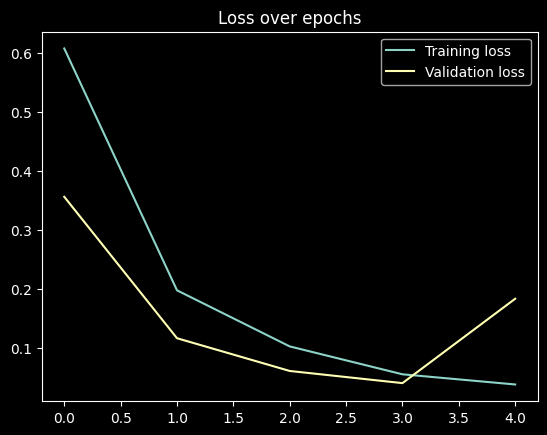

In [21]:
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend()
plt.title("Loss over epochs")
plt.show()

## Evaluating the Results



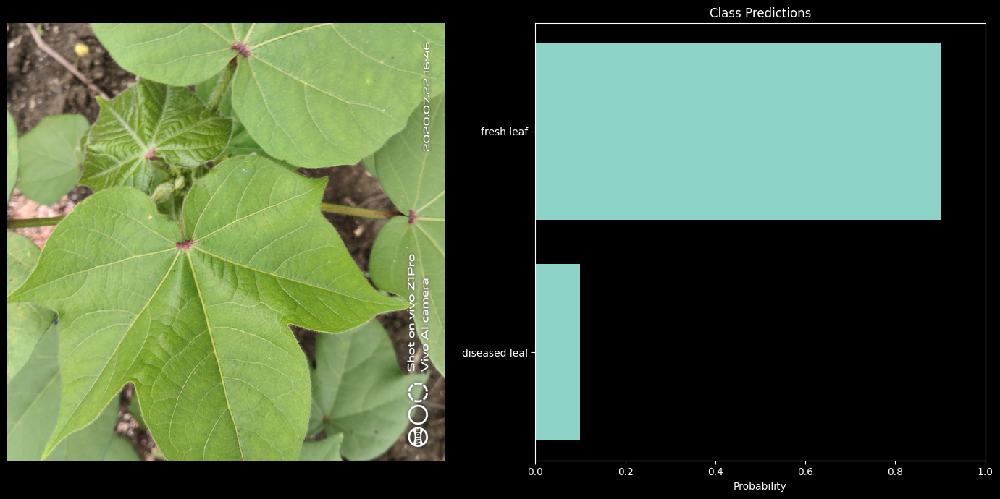

In [22]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    return image, transform(image).unsqueeze(0)

# Predict using the model
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy().flatten()

# Visualization
def visualize_predictions(original_image, probabilities, class_names):
    fig, axarr = plt.subplots(1, 2, figsize=(14, 7))
    
    # Display image
    axarr[0].imshow(original_image)
    axarr[0].axis("off")
    
    # Display predictions
    axarr[1].barh(class_names, probabilities)
    axarr[1].set_xlabel("Probability")
    axarr[1].set_title("Class Predictions")
    axarr[1].set_xlim(0, 1)

    plt.tight_layout()
    plt.show()

# Example usage
test_image = "./data/test/fresh leaf/d (396).jpg"
transform = transforms.Compose([
    transforms.Resize((227, 227)),
    transforms.ToTensor()
])

original_image, image_tensor = preprocess_image(test_image, transform)
probabilities = predict(model, image_tensor, device)

# Assuming dataset.classes gives the class names
class_names = dataset.classes 
visualize_predictions(original_image, probabilities, class_names)

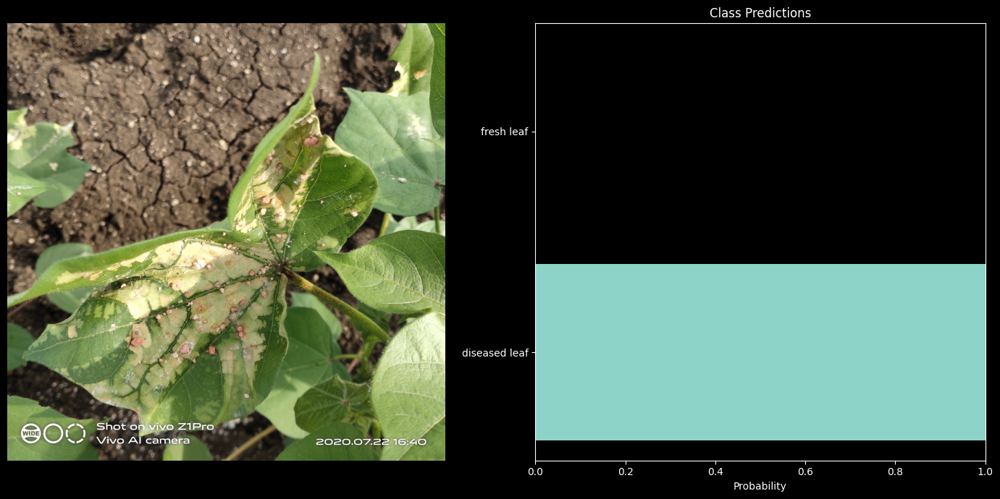

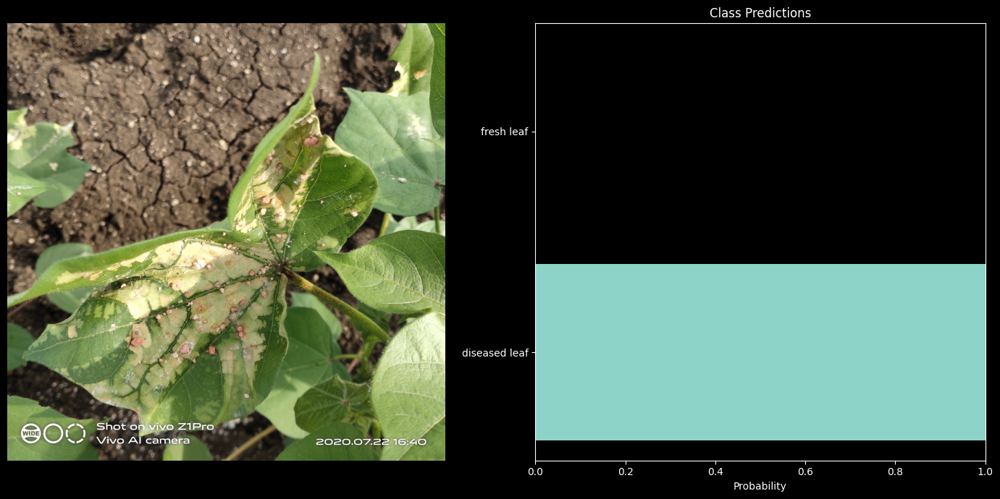

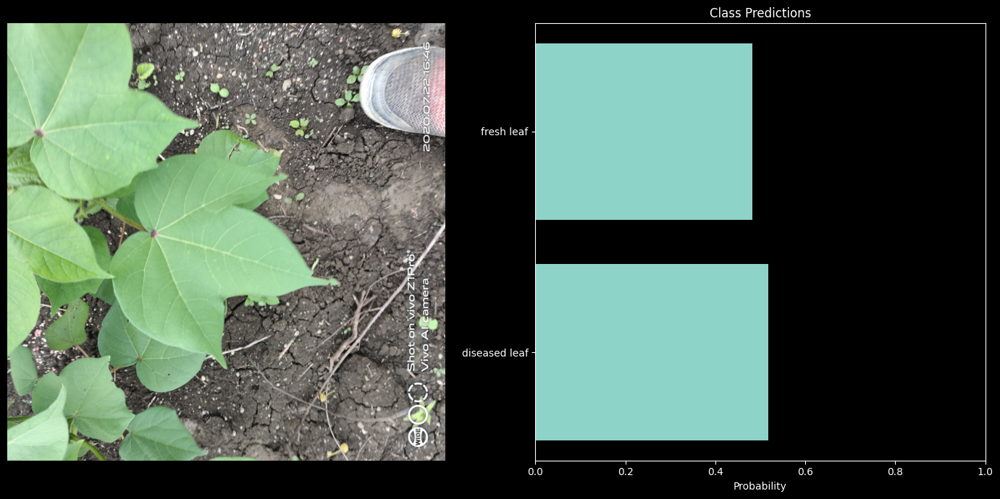

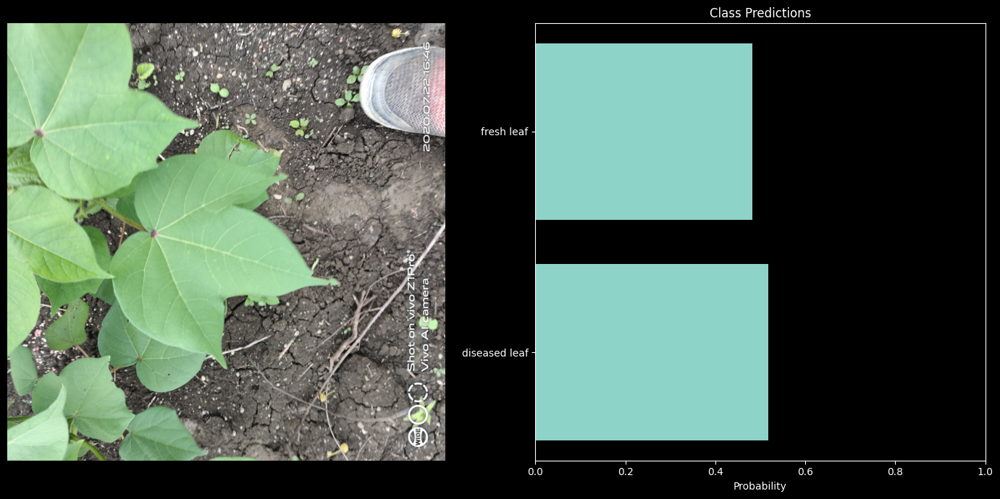

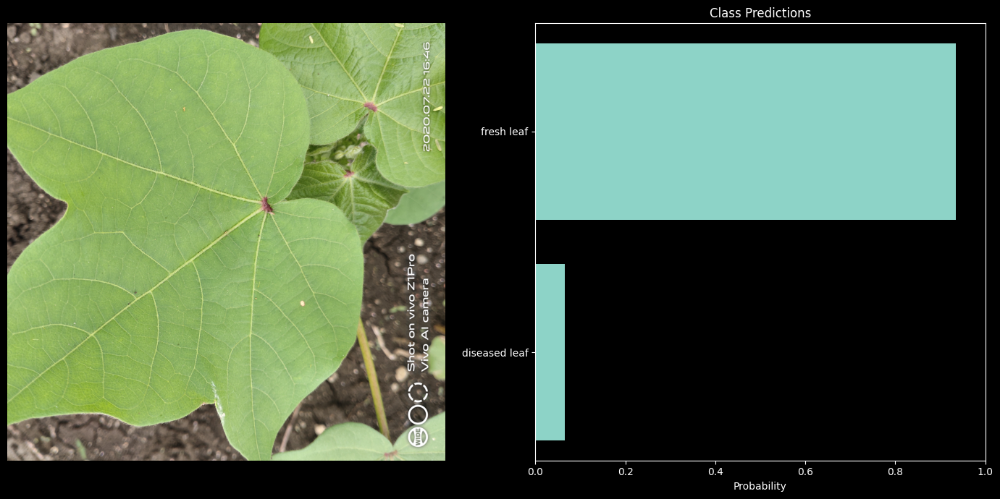

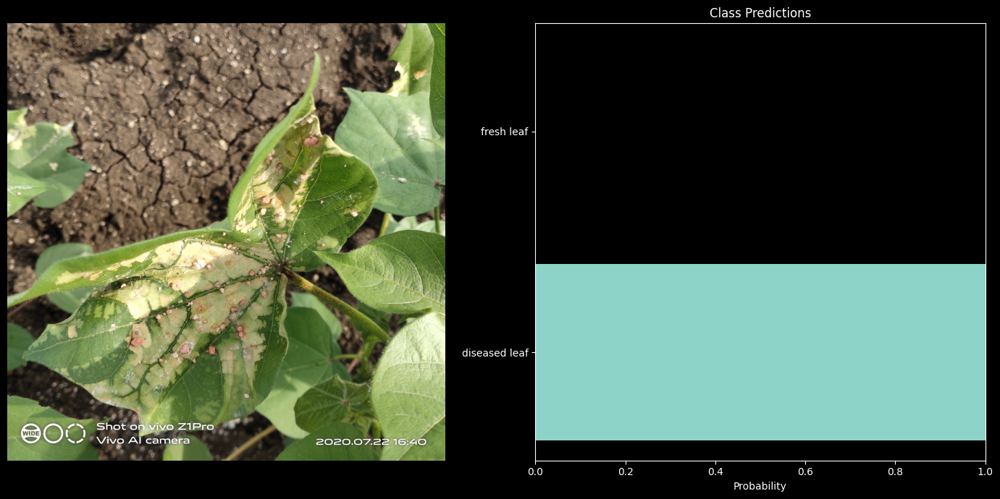

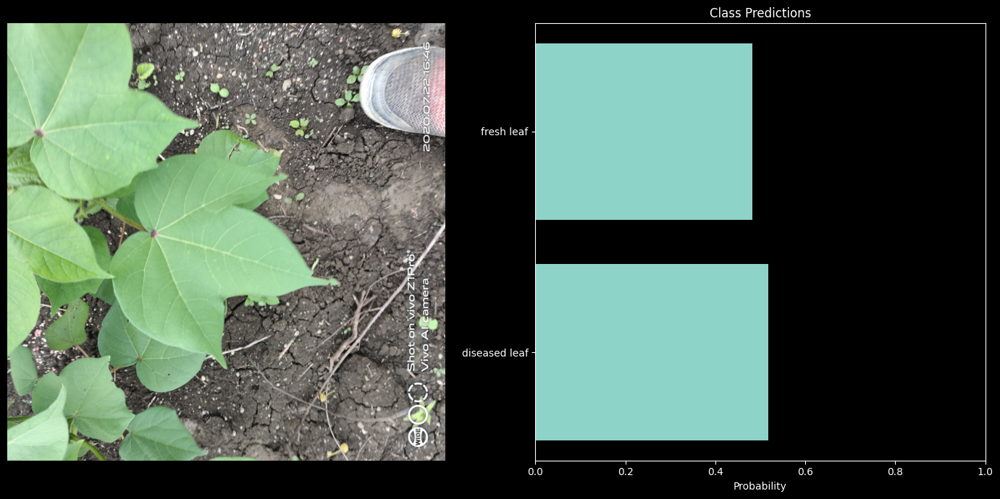

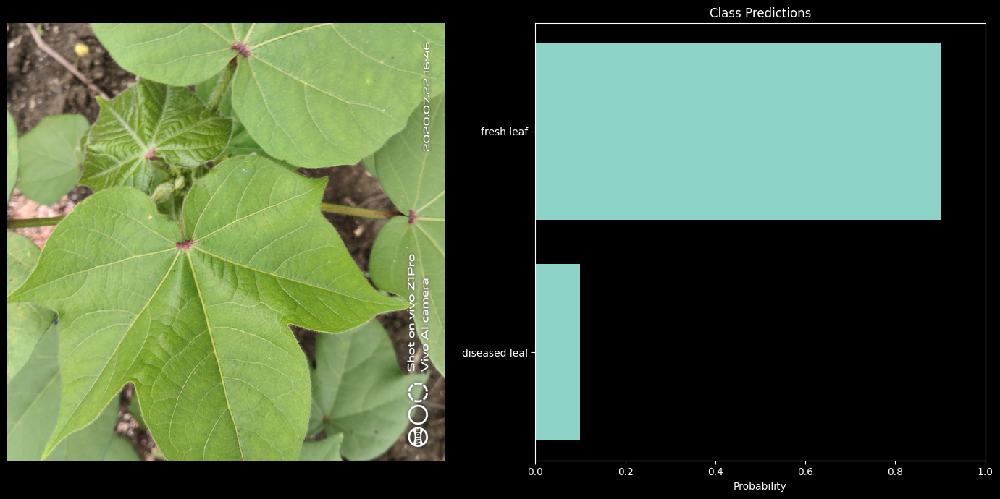

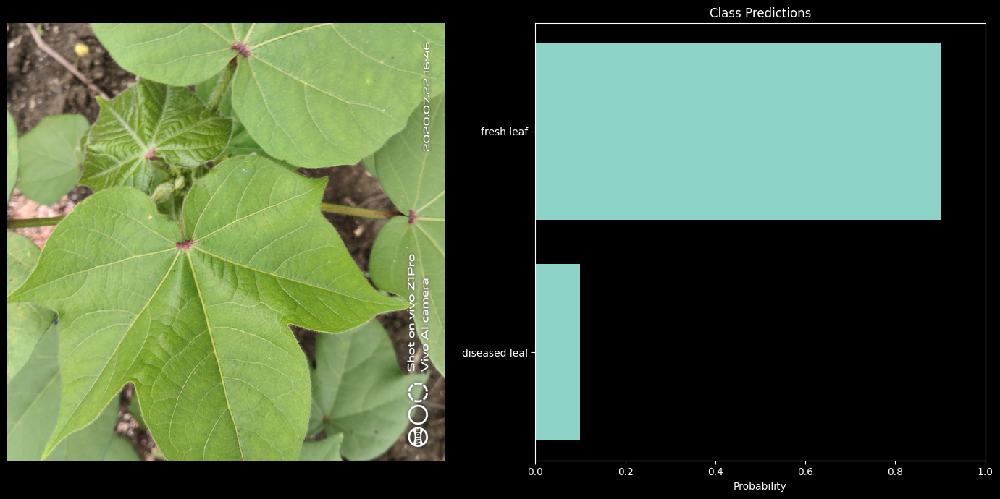

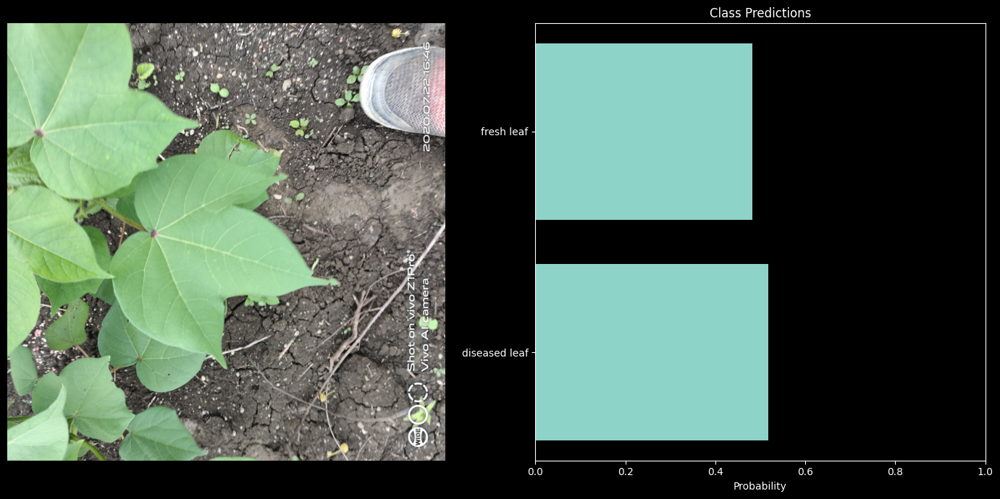

In [23]:
from glob import glob
test_images = glob('./data/test/*/*')
test_examples = np.random.choice(test_images, 10)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example, transform)
    probabilities = predict(model, image_tensor, device)

    # Assuming dataset.classes gives the class names
    class_names = dataset.classes 
    visualize_predictions(original_image, probabilities, class_names)

In [24]:
import torch

# Function to calculate accuracy
def calculate_accuracy(loader, model, device):
    model.eval()  # Set the model to evaluation mode
    correct = 0
    total = 0
    
    with torch.no_grad():  # Disable gradient calculation
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)  # Move data to the same device as the model
            outputs = model(images)  # Get model predictions
            _, predicted = torch.max(outputs, 1)  # Get the index of the max logit value (predicted class)
            total += labels.size(0)  # Increment total by the batch size
            correct += (predicted == labels).sum().item()  # Increment correct predictions
    
    accuracy = 100 * correct / total  # Calculate accuracy as a percentage
    return accuracy

# Assuming your validation and test data loaders are val_loader and test_loader
val_accuracy = calculate_accuracy(val_loader, model, device)
test_accuracy = calculate_accuracy(test_loader, model, device)

print(f'Validation Accuracy: {val_accuracy:.2f}%')
print(f'Test Accuracy: {test_accuracy:.2f}%')


Validation Accuracy: 94.81%
Test Accuracy: 94.81%
